# Insurance company

The number of claims received by an insurance company during a week follows a Poisson distribution with unknown mean (μ).
The number of claims, per week, observed ovr a ten week period are:
 5, 8, 4, 6, 11, 6, 6, 5, 6, 4

## Suppose to use a prior uniform distribution for μ. 
* find the posterior distribution for μ and compute the posterior mean, median and variance
* plot the posterior distribution and the 95% credibility interval


mean_uniform,var_uniform,median_uniform,low_95_cred,up_95_cred
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
6.2,0.62,6.17,4.75,7.84


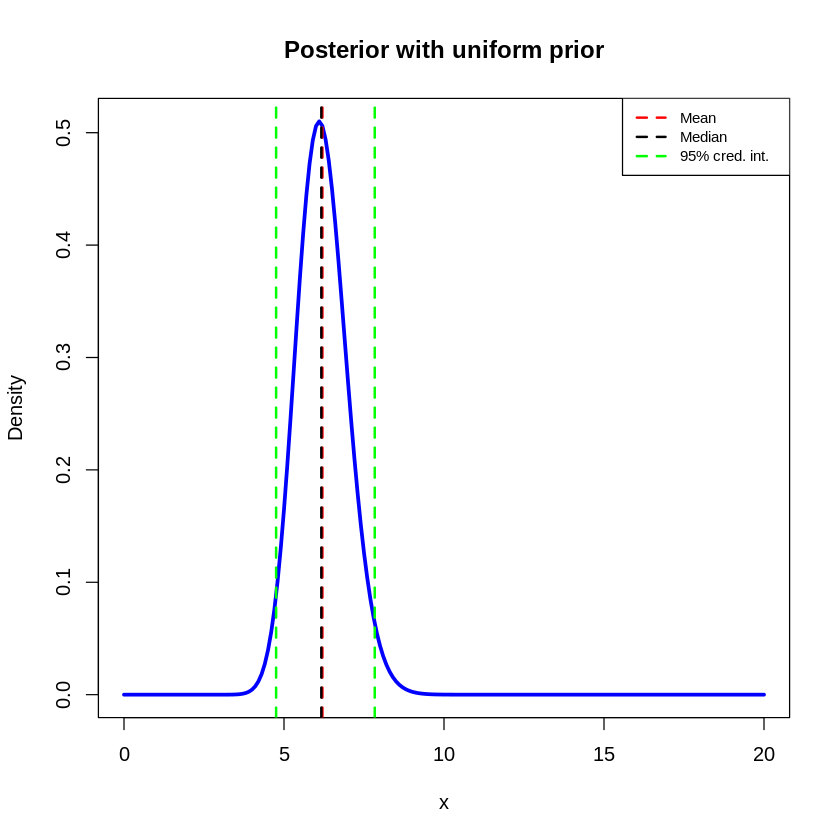

In [1]:
#uniform
x = c(5, 8, 4, 6, 11, 6, 6, 5, 6, 4)

#from theory
alpha_post_uniform  = sum(x)+1
lambda_post_uniform = length(x)

p  = seq(0,20,.1)
post_unif = dgamma(p,alpha_post_uniform,lambda_post_uniform)



#analitically values-unif
mean_uniform   = alpha_post_uniform/lambda_post_uniform
var_uniform    = alpha_post_uniform/(lambda_post_uniform**2)
median_uniform = qgamma(0.5,alpha_post_uniform,lambda_post_uniform)


#95% cred interval
lower_unif = qgamma(.025,alpha_post_uniform ,lambda_post_uniform)
upper_unif = qgamma(.975,alpha_post_uniform,lambda_post_uniform)

#show the results
uniform_summary_table = data.frame(mean_uniform = mean_uniform,
                                   var_uniform = var_uniform, 
                                   median_uniform = round(median_uniform,2),
                                  low_95_cred = round(lower_unif,2),
                                  up_95_cred = round(upper_unif,2)) #95% credibility interval

uniform_summary_table

plot(p,post_unif,
    xlab= "x",
    ylab="Density",
    col="blue",
    main="Posterior with uniform prior",
    lwd=3,
    type="l")
abline(v=c(mean_uniform,median_uniform), col=c("red","black"), lty=c(2,2), lwd=c(2,2))
abline(v=c(lower_unif,upper_unif),col="green",lty=2,lwd=2)

legend(x = "topright",
       col = c("red","black","green"),
       lty = 2,
       lwd = 2,
       cex=0.75,
       legend = c('Mean ', 'Median ',"95% cred. int."))


## Suppose to use a Jeffreys’ prior for μ (g(μ) ∝ 1/sqrtμ)

* find the posterior distribution for μ and compute the posterior mean, median and variance
* plot the posterior distribution and the 95% credibility interval

mean_jeffrey,var_jeffrey,median_jeffrey,low_95_cred,up_95_cred
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
6.15,0.615,6.12,4.71,7.78


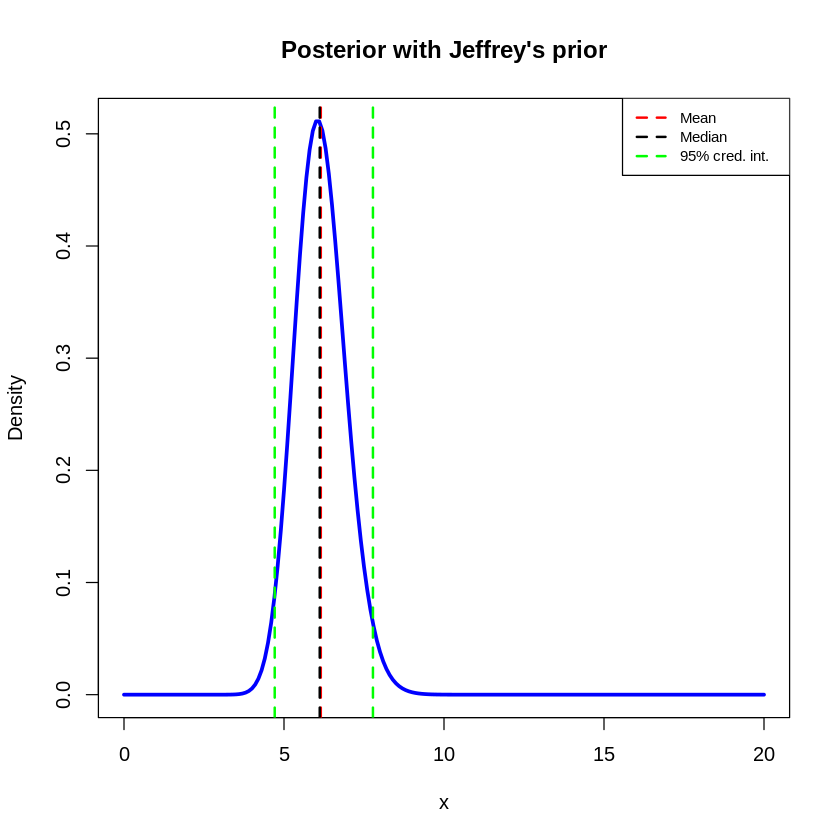

In [2]:
#from theory
alpha_post_jeffrey  = sum(x) + .5
lambda_post_jeffrey = length(x)

post_jeffrey = dgamma(p,alpha_post_jeffrey,lambda_post_jeffrey)

mean_jeffrey   = alpha_post_jeffrey/lambda_post_jeffrey
var_jeffrey    = alpha_post_jeffrey/(lambda_post_jeffrey**2)
median_jeffrey = qgamma(0.5,alpha_post_jeffrey,lambda_post_jeffrey)


#95% cred interval
lower_j = qgamma(.025,alpha_post_jeffrey ,lambda_post_jeffrey)
upper_j = qgamma(.975,alpha_post_jeffrey,lambda_post_jeffrey)

#show the results
jeffrey_summary_table = data.frame(mean_jeffrey = mean_jeffrey,
                                   var_jeffrey = var_jeffrey, 
                                   median_jeffrey = round(median_jeffrey,2),
                                  low_95_cred = round(lower_j,2),
                                  up_95_cred = round(upper_j,2)) #95% credibility interval

jeffrey_summary_table

plot(p,post_jeffrey,
    xlab= "x",
    ylab="Density",
    col="blue",
    main="Posterior with Jeffrey's prior",
    lwd=3,
    type="l")
abline(v=c(mean_jeffrey,median_jeffrey), col=c("red","black"), lty=c(2,2), lwd=c(2,2))
abline(v=c(lower_j,upper_j),col="green",lty=2,lwd=2)

legend(x = "topright",
       col = c("red","black","green"),
       lty = 2,
       lwd = 2,
       cex=0.75,
       legend = c('Mean ', 'Median ',"95% cred. int."))


## Evaluate a 95% credibility interval for the results obtained with both priors. Compare the result with that obtained using a normal approximation for the posterior distribution, with the same mean and standard deviation


In [3]:
cat("Uniform prior -- 95% credibility interval")
uniform_summary_table[1,4:5]
cat("=============================\n")
cat("Jeffrey's prior -- 95% credibility interval")
jeffrey_summary_table[1,4:5]

Uniform prior -- 95% credibility interval

,low_95_cred,up_95_cred
,<dbl>,<dbl>
1,4.75,7.84


Jeffrey's prior -- 95% credibility interval

,low_95_cred,up_95_cred
,<dbl>,<dbl>
1,4.71,7.78


In [4]:
#95% cred interval
lower_norm_unif = qnorm(.025,mean_uniform , sqrt(var_uniform))
upper_norm_unif = qnorm(.975,mean_uniform,sqrt(var_uniform))

normal_summary_table_unif = data.frame(low_95_cred = round(lower_norm_unif,2),
                                 up_95_cred   = round(upper_norm_unif,2))
normal_summary_table_unif

low_95_cred,up_95_cred
<dbl>,<dbl>
4.66,7.74


In [5]:
#95% cred interval
lower_norm_j = qnorm(.025,mean_jeffrey , sqrt(var_jeffrey))
upper_norm_j = qnorm(.975,mean_jeffrey,sqrt(var_jeffrey))

normal_summary_table_j = data.frame(low_95_cred = round(lower_norm_j,2),
                                 up_95_cred   = round(upper_norm_j,2))
normal_summary_table_j

low_95_cred,up_95_cred
<dbl>,<dbl>
4.61,7.69


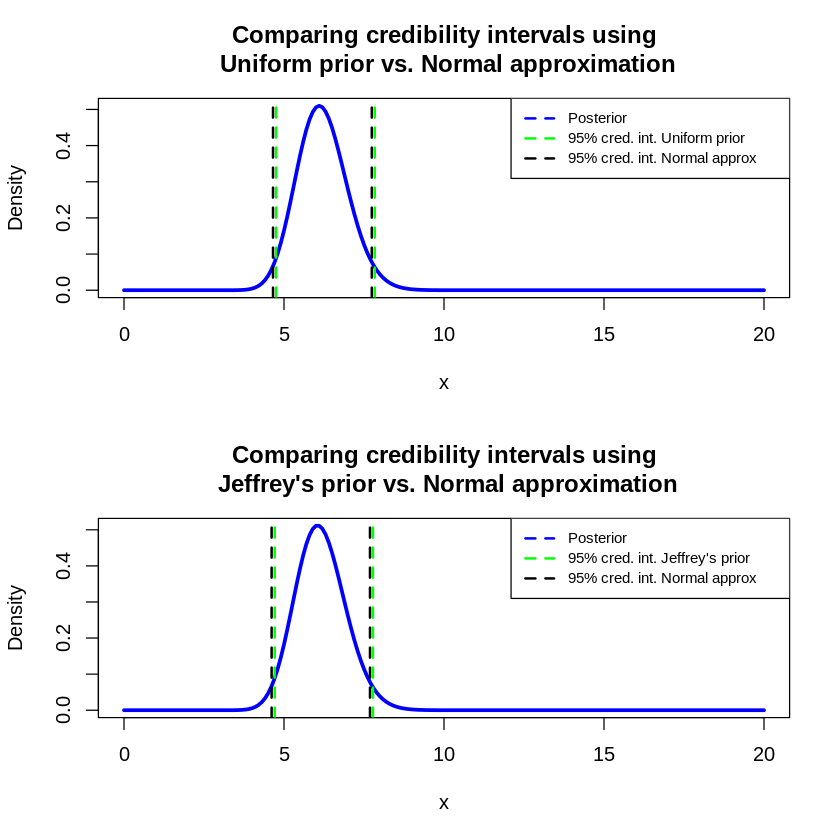

In [6]:
par(mfrow = c(2, 1))

plot(p,post_unif,
    xlab= "x",
    ylab="Density",
    col="blue",
    main="Comparing credibility intervals using\n Uniform prior vs. Normal approximation",
    lwd=3,
    type="l")

abline(v=c(lower_unif,upper_unif),col="green",lty=2,lwd=2)
abline(v=c(lower_norm_unif,upper_norm_unif),col="black",lty=2,lwd=2)
legend(x = "topright",
       col = c("blue","green","black"),
       lty = 2,
       lwd = 2,
       cex=0.75,
       legend = c('Posterior ', '95% cred. int. Uniform prior ',"95% cred. int. Normal approx"))

plot(p,post_jeffrey,
    xlab= "x",
    ylab="Density",
    col="blue",
    main="Comparing credibility intervals using\n Jeffrey's prior vs. Normal approximation",
    lwd=3,
    type="l")

abline(v=c(lower_j,upper_j),col="green",lty=2,lwd=2)
abline(v=c(lower_norm_j,upper_norm_j),col="black",lty=2,lwd=2)
legend(x = "topright",
       col = c("blue","green","black"),
       lty = 2,
       lwd = 2,
       cex=0.75,
       legend = c("Posterior", "95% cred. int. Jeffrey's prior ","95% cred. int. Normal approx"))

# Blood disease

A well established and diffused method for detecting a disease in blood fails to detect the presence of disease in 15% of the patients that actually have the disease.

A young UniPD startUp has developed an innovative method of screening. During the qualification phase, a random sample of n = 75 patients known to have the disease is screened using the new method.

## What is the probability distribution of y, the number of times the new method fails to detect the disease ?

## On the n = 75 patients sample, the new method fails to detect the disease in y = 6 cases. What is the frequentist estimator of the failure probability of the new method ?

In [7]:
y = 6
n = 75

cat("Frequentist estimator of the failure probability is:",round(y/n*100,2),"%")

Frequentist estimator of the failure probability is: 8 %

## Set up a bayesian computation of the posterior probability, assuming a beta distribution with mean value 0.15 and standard deviation 0.14. Plot the posterior distribution for y, and mark on the plot the mean value and variance


Mean is: 0.08478674
Variance is: 0.03132624

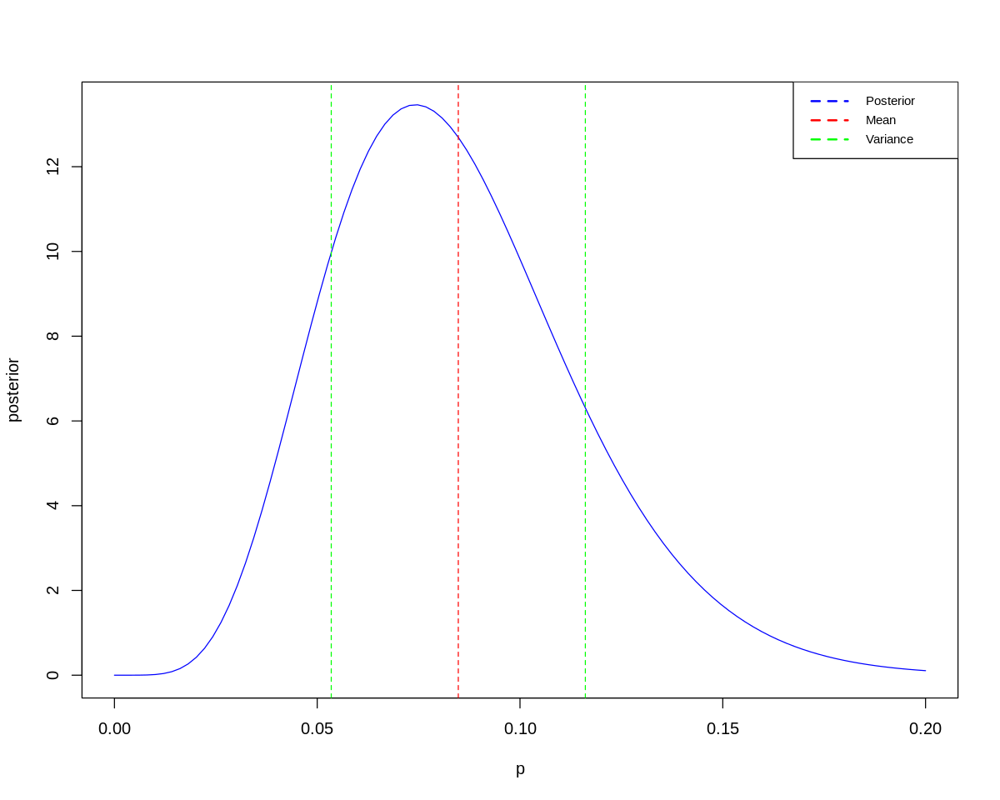

In [8]:
p = seq(0,.2,length.out = 100)

mean_prior = .15
std_prior = .14

#from theory 
#parameters of beta function
a = - mean_prior*(std_prior**2 + mean_prior**2 - mean_prior)/std_prior**2
b = (std_prior**2 + mean_prior**2 - mean_prior)*(mean_prior - 1)/std_prior**2


#assuming beta prior
#posterior is the conjugate of prior with new alpha and beta parameters
a_ = a+y
b_ = b+n-y
posterior = dbeta(p,a_,b_)
mean_post = a_/(a_+b_)
#var_post  = a_*b_/((a_ + b_)**2 * (a_+b_+1))
std_post = 1/n * sqrt(y*(n-y)/n)

cat("Mean is:",mean_post)
cat("\nVariance is:", std_post)

options(repr.plot.width=10, repr.plot.height=8)
plot(p,posterior,type="l",col="blue")
abline(v=mean_post,lty=2,col="red")
abline(v=c(mean_post+std_post,mean_post-std_post),lty=2,col="green")
legend(x = "topright",
       col = c("blue","red","green"),
       lty = 2,
       lwd = 2,
       cex=0.75,
       legend = c("Posterior", "Mean ","Variance"))

Best estimator using a frequentist and bayesian approach is the same, i.e. 8%

## Perform a test of hypothesis assuming that if the probability of failing to the detect the desease in ill patients is greater or equal than 15%, the new test is no better that the traditional method. Test the sample at a 5% level of significance in the Bayesian way.

In [9]:
binom.test(y,n,p=.15,"less",conf.level = .05)


	Exact binomial test

data:  y and n
number of successes = 6, number of trials = 75, p-value = 0.05435
alternative hypothesis: true probability of success is less than 0.15
5 percent confidence interval:
 0.00000000 0.04462777
sample estimates:
probability of success 
                  0.08 


p-value is not less than 5% so we can not reject the null hypothesis.

## Perform the same hypothesis test in the classical frequentist way.

In [10]:
#compute p value
 
pbinom(y,n,.15) < .05

[1] FALSE

Even in the frequentist approach we can not reject the null hypothesis.

# Lighthouse problem

Given the problem of the lightouse discussed last week, study the case in which both the position along the shore (α) and the distance out at sea (β) are unknown

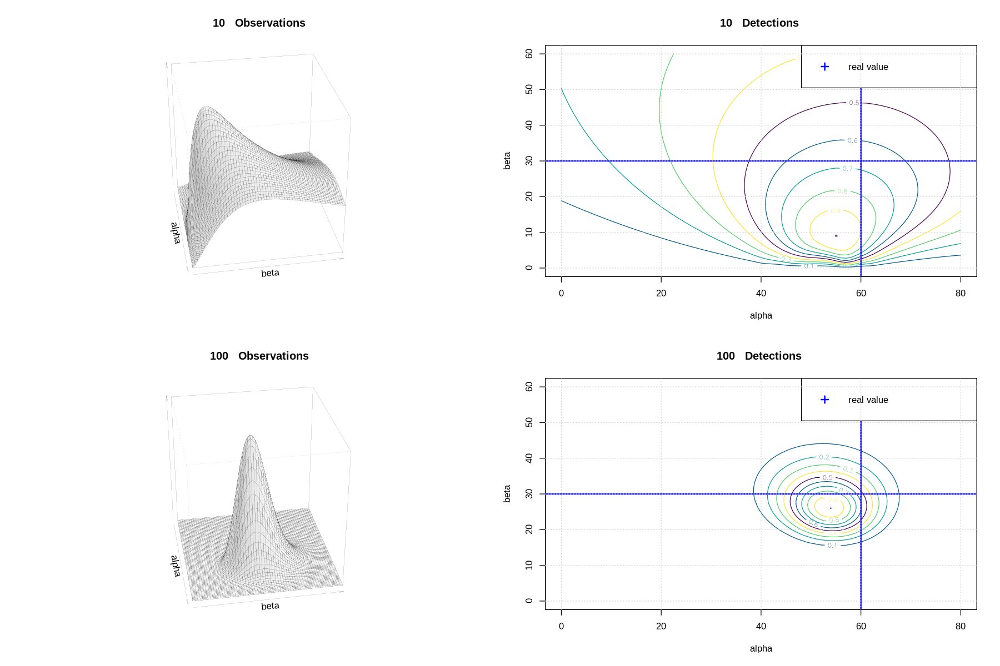

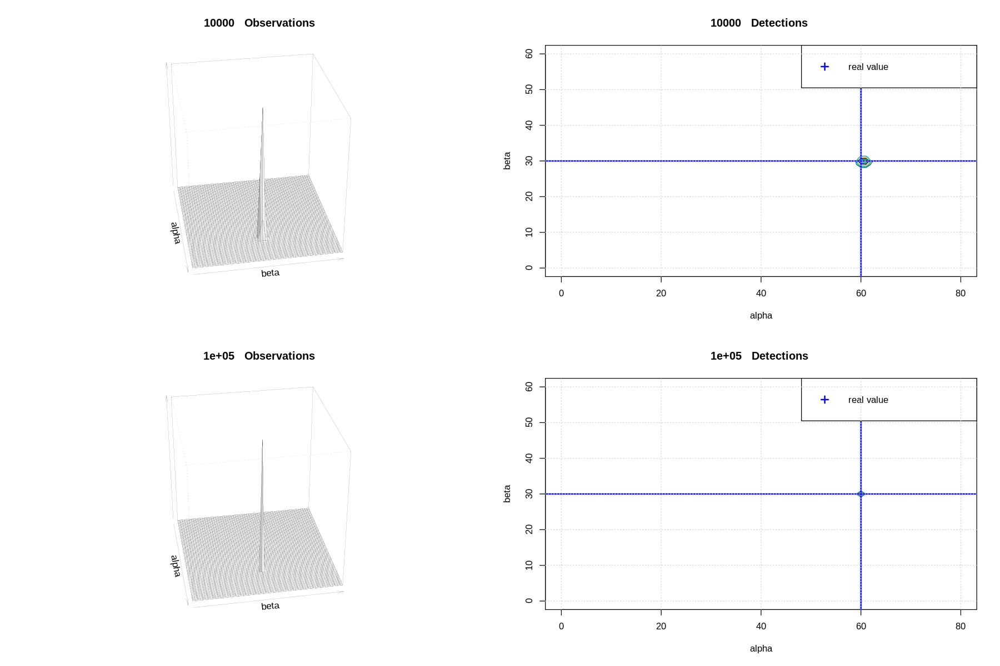

In [11]:
options(repr.plot.width=15, repr.plot.height=10)
par(mfrow=c(2,2))


# computes the cauchy pdf for the likelihood p(x_k|alpha,beta)

make_log_posterior = function (x_k, beta) {
  Vectorize(function (alpha_hat) {
              sum( log((beta/pi) / (beta^2 + (x_k - alpha_hat)^2)) )
 })
}

#number of detection
number_dec=c(10,100,10000,100000)


for(N in number_dec){

#true values
alpha = 60
beta  = 30


#random position
theta_k = runif(N,-pi/2,pi/2)
x_k = beta * tan(theta_k) + alpha

#log of posterior knowing beta
log_posterior = Vectorize(function (alpha_hat) {sum( log((beta/pi) / (beta^2 + (x_k - alpha_hat)^2)))})

#compute the log posterior for grid values
posterior_shape = function(y, log_posterior) {
  log_alphas    = log_posterior(y)        
  log_alpha_max = max(log_alphas)            
  alphas = exp(log_alphas - log_alpha_max)
  alphas                                    
}

#log posterior without knowning alpha and beta
logposteriorfin = function (x_k, alfa, beta) {
  sum( log((beta/pi) / (beta^2 + (x_k - alfa)^2)) )
}

#range interval for alpha and beta
alpha_min = 0; alpha_max = 80; beta_max = 60
alphas = seq(alpha_min, alpha_max)
betas  = seq(0, beta_max)

#function for the final posterior 
f = function(a,b) logposteriorfin(x_k, a, b)

#values for the plot
logvalues = outer(alphas, betas, Vectorize(f))


values = matrix(posterior_shape(logvalues, log_posterior),nrow=length(alphas), ncol=length(betas))


#plots
persp(alphas, betas , values,
      xlab=bquote(alpha), ylab=bquote(beta), zlab="", 
      main=paste(N, " ", "Observations ") , cex=0.7, lwd=0.1  , 
      xlim=c(alpha_min,alpha_max), ylim=c(0,beta_max), zlim=c(0,1),
      theta=80, phi=30, d=5.0, shade=0.05)


cols = hcl.colors(5, "Viridis")
contour(alphas,
        betas,
        values ,
        col=cols,
        xlim=c(0,80),
        ylab="beta",
        main=paste(N, " ", "Detections "),
        xlab="alpha",
        ylim=c(0,60))
    
abline(v=alpha,col="blue",lwd=2)
abline(h=beta, col="blue",lwd=2)

legend("topright",c("real value"),col="blue", pch=3,pt.cex=1.2,pt.lwd=2) 

grid()
    }



# Signal - Background
Given the Signal over Background example discussed last week, analyze and discuss the following cases:

* Vary the sampling resolution keeping the same sampling range 
* change the resolution
* check the effect on the results

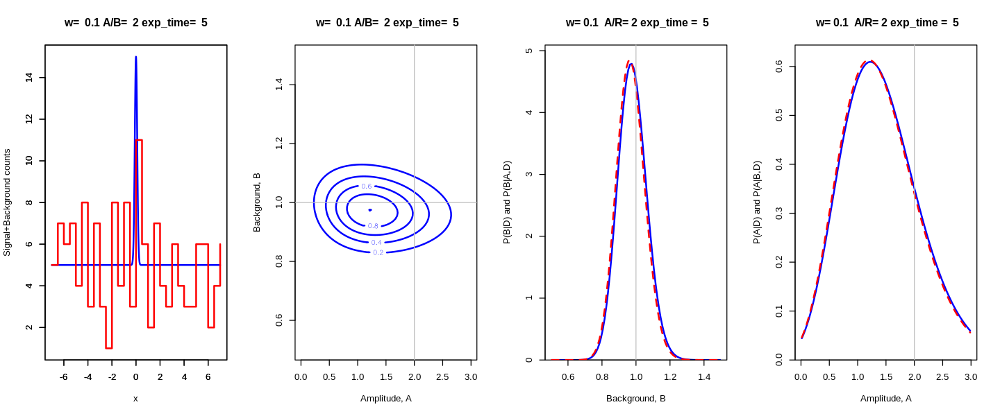

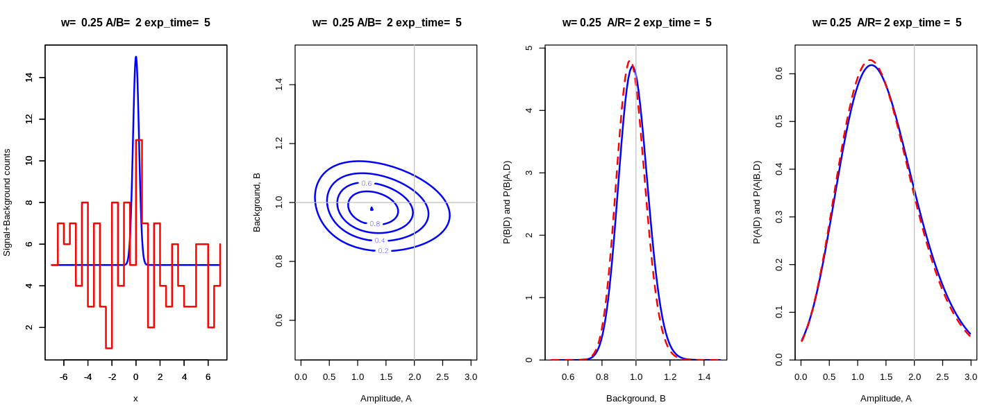

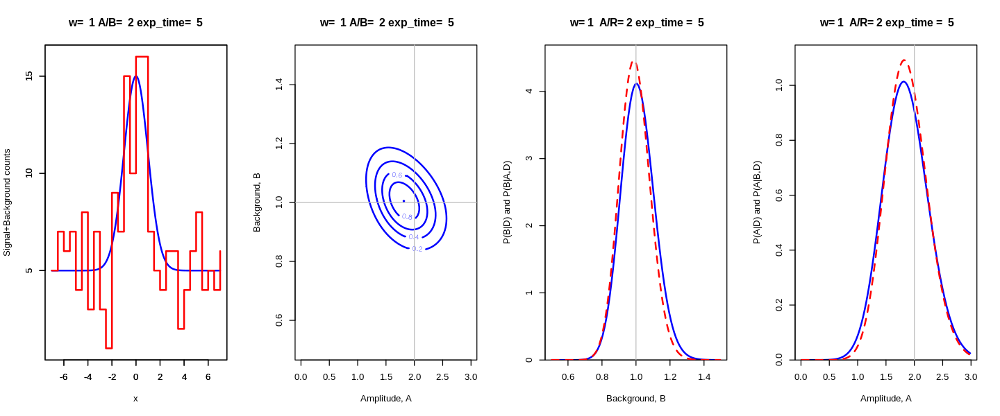

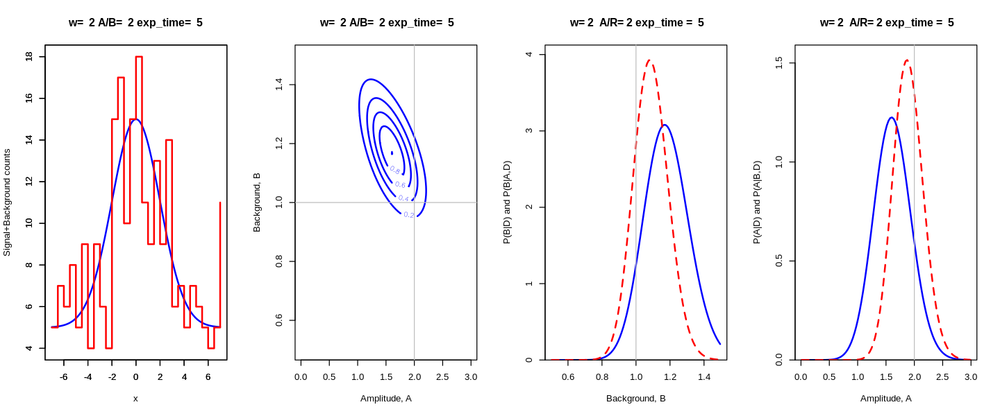

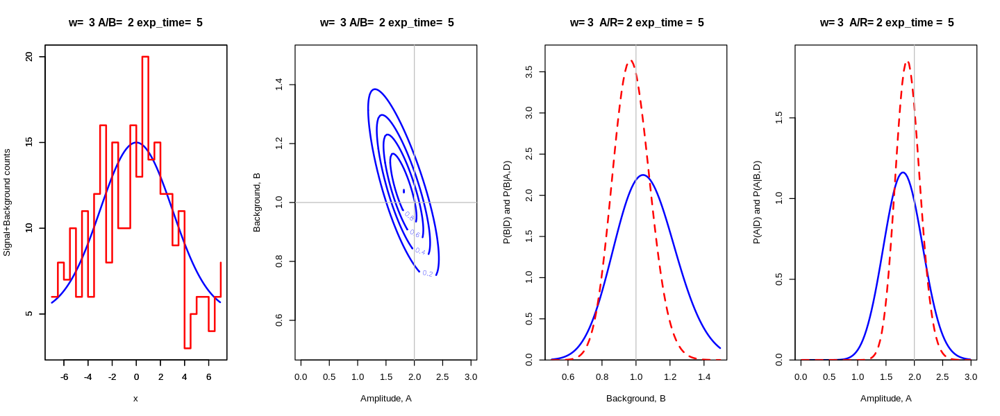

In [12]:
signal = function(x, a, b, x0, w, t) {
    #function that generates the signal 
  t*(a*exp(-(x-x0)^2/(2*w^2)) + b)
}
log_posterior = function(d, x, a, b, x0, w, t) {
    #function that returns the posterior
  if(a<0 || b <0) {return(-Inf)} # the effect of the prior
  sum(dpois(d, lambda=signal(x, a, b, x0, w, t), log=TRUE))
}


A = 2
B = 1 
exposure_time = 5 

sampling_resolutions = c(0.1, 0.25, 1, 2, 3)

for (w in sampling_resolutions){
    
    alim = c(0.0, A+min(c(2, A/2)))
    blim = c(0.5, B+min(c(2, B/2)))
    N_samples = 100
    uniGrid = seq(from=1/(2*N_samples), to=1-1/(2*N_samples), by=1/N_samples) 
    delta_a = diff(alim)/N_samples 
    delta_b = diff(blim)/N_samples
    a = alim[1] + diff(alim)*uniGrid 
    b = blim[1] + diff(blim)*uniGrid
    
    #variables setup and signal generation
    x0=0
    
    set.seed(69)
    xdat = seq(from=-7, to=7, by=0.5)
    true_signal = signal(xdat, A, B, x0, w, exposure_time) 
    ddat = rpois(length(true_signal), true_signal)
    
    # Compute log posterior on grid
    z = matrix(data=NA, nrow=length(a), ncol=length(b)) 
    for(j in 1:length(a)) {
        for(k in 1:length(b)) {
            z[j,k] = log_posterior(ddat, xdat, a[j], b[k], x0, w, exposure_time)
        } 
    }
    z = z - max(z) #set maximum to zero
    
    #marginalization
    p_a_D = apply(exp(z), 1, sum)
    p_a_D = p_a_D/(delta_a*sum(p_a_D))
    p_b_D = apply(exp(z), 2, sum) 
    p_b_D = p_b_D/(delta_b*sum(p_b_D))
    
    p_a_bD = exp(Vectorize(log_posterior, "a")(ddat, xdat, a, B, x0, w, exposure_time))
    p_a_bD = p_a_bD/(delta_a*sum(p_a_bD))
    p_b_aD = exp(Vectorize(log_posterior, "b")(ddat, xdat, A, b, x0, w, exposure_time))
    p_b_aD = p_b_aD/(delta_b*sum(p_b_aD))
    
    par(mfrow=c(1,4)) 
    options(repr.plot.width=12, repr.plot.height=5)
    
    #plot data
    xplot = seq(from=min(xdat), to=max(xdat), by=0.05*w) 
    splot = signal(xplot, A, B, x0, w, exposure_time) 
    plot(xplot, splot, ylim=range(c(splot, ddat)), xlab="x", ylab="Signal+Background counts", type="l", col="blue", lwd=2, main=paste("w= ",w,"A/B= ",A,"exp_time= ",exposure_time))
    par(new=TRUE)
    plot(xdat , ddat , type='s',col='red',lwd=2, xlab="", ylab="", xlim=range(xplot), ylim=range(c(splot, ddat)))
    
    #Plot unnormalized 2D posterior as contours. 
    contour(a, b, exp(z),nlevels = 5,labcex = 0.5,lwd = 2, col= "blue", xlab="Amplitude, A", ylab="Background, B", main=paste(" w= ",w,"A/B= ",A,"exp_time= ",exposure_time))
    abline(v=A,h=B,col="grey")
    
    #Plot the 1D marginalized posteriors
    plot(b, p_b_D, xlab="Background, B", col= "blue", yaxs="i",ylim=1.05*c(0,max(p_b_D, p_b_aD)), ylab="P(B|D) and P(B|A,D)",type="l", lwd=2, main=paste(' w=',w,' A/R=',A,"exp_time = ",exposure_time))
    lines(b, col= "red",p_b_aD, lwd=2, lty=2) 
    abline(v=B, col="grey")
    plot(a, p_a_D, xlab="Amplitude, A", col="blue", yaxs="i",ylim=1.05*c(0,max(p_a_D, p_a_bD)), ylab="P(A|D) and P(A|B,D)", type="l", lwd=2, main=paste(' w=',w,' A/R=',A,"exp_time = ",exposure_time))
    lines(a, p_a_bD, col="red",lwd=2, lty=2) 
    abline(v=A, col="grey")
    
    
}




## Change the ratio A/B used to simulate the data (keeping both positive in accordance with the prior)
• Check the effect on the results


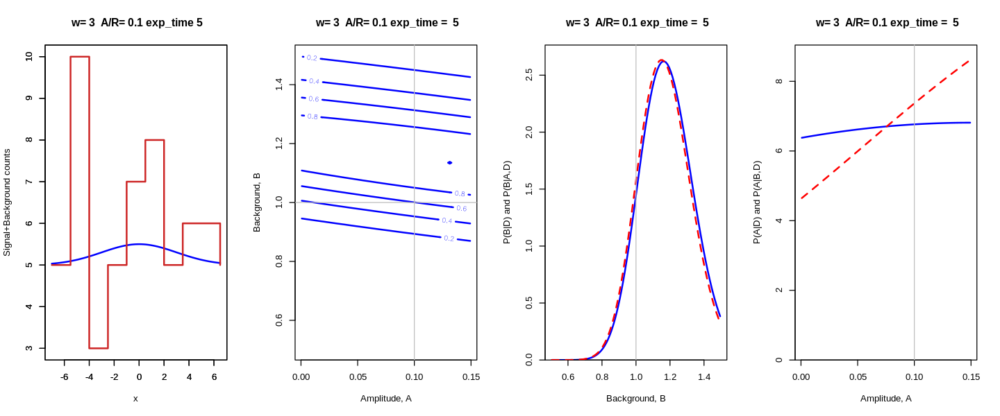

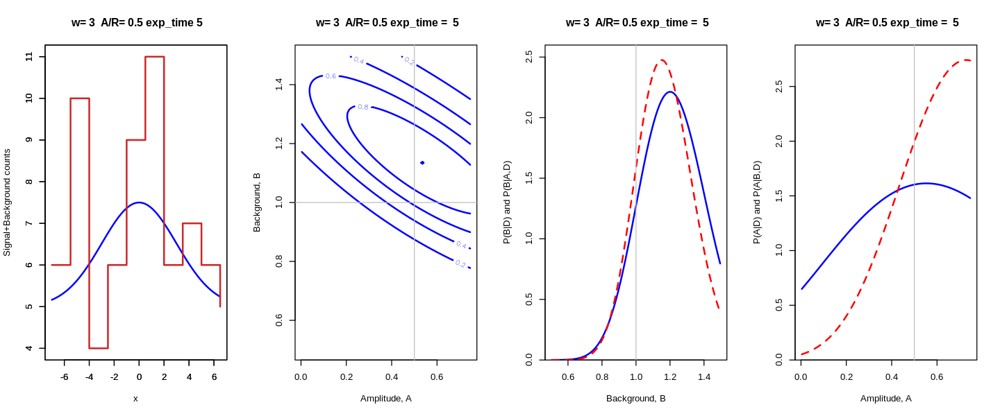

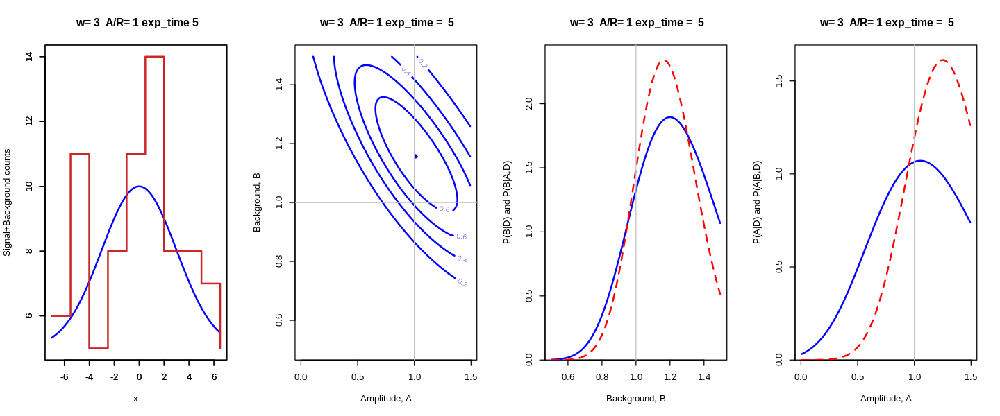

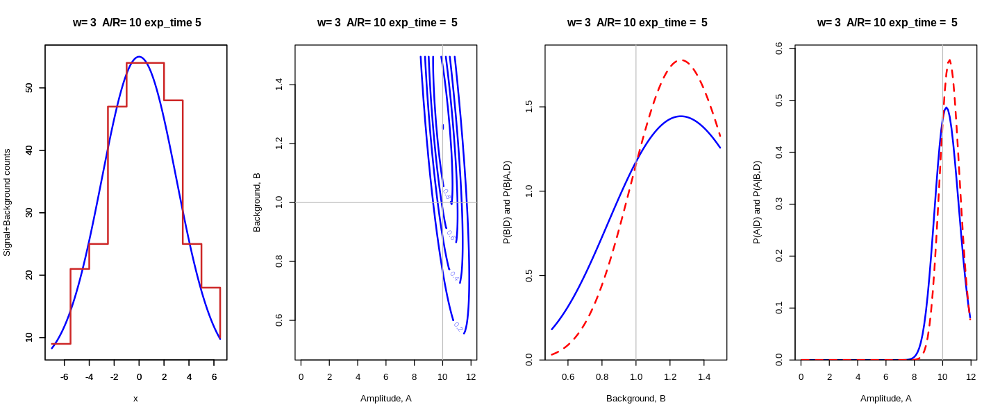

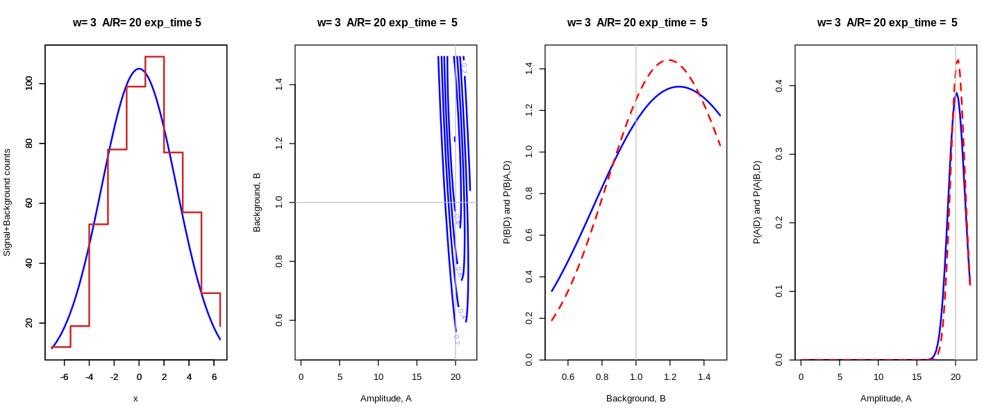

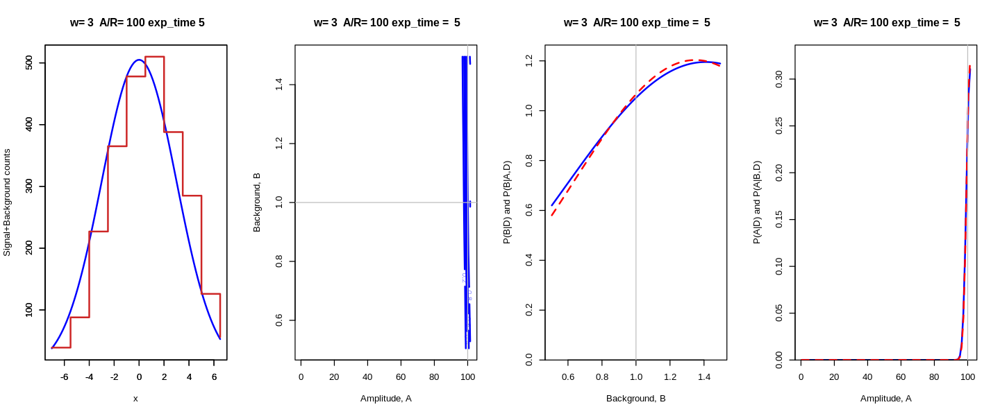

In [13]:
A_list = c(0.1, 0.5, 1, 10, 20, 100)
N_samples = 100

for (A in A_list) {
    
    alim = c(0.0, A+min(c(2, A/2)))
    blim = c(0.5, B+min(c(2, B/2)))
    
    uniGrid = seq(from=1/(2*N_samples), to=1-1/(2*N_samples), by=1/N_samples) 
    delta_a = diff(alim)/N_samples 
    delta_b = diff(blim)/N_samples
    a = alim[1] + diff(alim)*uniGrid 
    b = blim[1] + diff(blim)*uniGrid
    
    #variables setup and signal generation
    x0=0
    
    set.seed(420)
    xdat = seq(from=-7, to=7, by=0.5*w)
    signal_true = signal(xdat, A, B, x0, w, exposure_time) 
    ddat = rpois(length(signal_true), signal_true)
    
    # Compute log unnormalized posterior, z = ln Pˆ*(a,b|D), on a regular grid
    z = matrix(data=NA, nrow=length(a), ncol=length(b)) 
    for(j in 1:length(a)) {
        for(k in 1:length(b)) {
            z[j,k] = log_posterior(ddat, xdat, a[j], b[k], x0, w, exposure_time)
        } 
    }
    z = z - max(z) #set maximum to zero
    
    #marginalization
    p_a_D = apply(exp(z), 1, sum)
    p_a_D = p_a_D/(delta_a*sum(p_a_D))
    p_b_D = apply(exp(z), 2, sum) 
    p_b_D = p_b_D/(delta_b*sum(p_b_D))
    
    p_a_bD = exp(Vectorize(log_posterior, "a")(ddat, xdat, a, B, x0, w, exposure_time))
    p_a_bD = p_a_bD/(delta_a*sum(p_a_bD))
    p_b_aD = exp(Vectorize(log_posterior, "b")(ddat, xdat, A, b, x0, w, exposure_time))
    p_b_aD = p_b_aD/(delta_b*sum(p_b_aD))
    
    par(mfrow=c(1,4))
    
    #plot data
    xplot = seq(from=min(xdat), to=max(xdat), by=0.05*w) 
    splot = signal(xplot, A, B, x0, w, exposure_time) 
    plot(xplot, splot, ylim=range(c(splot, ddat)), xlab="x", ylab="Signal+Background counts", type="l", col="blue", lwd=2, main=paste(' w=',w,' A/R=',A,"exp_time",exposure_time))
    par(new=TRUE)
    plot(xdat , ddat , type='s',col='firebrick3',lwd=2, xlab="", ylab="", xlim=range(xplot), ylim=range(c(splot, ddat)))
    
    # Plot unnormalized 2D posterior as contours. 
    contour(a, b, exp(z),nlevels = 5,labcex = 0.5,lwd = 2, col= "blue", xlab="Amplitude, A", ylab="Background, B", main=paste(' w=',w,' A/R=',A,"exp_time = ",exposure_time))
    abline(v=A,h=B,col="grey")
    
    # Plot the 1D marginalized posteriors
    plot(b, p_b_D, xlab="Background, B", col= "blue", yaxs="i",ylim=1.05*c(0,max(p_b_D, p_b_aD)), ylab="P(B|D) and P(B|A,D)",type="l", lwd=2, main=paste(' w=',w,' A/R=',A,"exp_time = ",exposure_time))
    lines(b, col= "red",p_b_aD, lwd=2, lty=2) 
    abline(v=B, col="grey")
    plot(a, p_a_D, xlab="Amplitude, A", col="blue", yaxs="i",ylim=1.05*c(0,max(p_a_D, p_a_bD)), ylab="P(A|D) and P(A|B,D)", type="l", lwd=2, main=paste(' w=',w,' A/R=',A,"exp_time = ",exposure_time))
    lines(a, p_a_bD, col="red",lwd=2, lty=2) 
    abline(v=A, col="grey")
}

